In [1]:
from src.WGS import WGS
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from shapely.geometry import Polygon, Point
from joblib import Parallel, delayed
from tqdm import tqdm

import os
path_border = "src/csv/polygon_border.csv"
path_obs = "src/csv/polygon_obstacle.csv"

plg_border = pd.read_csv(path_border).to_numpy()
plg_obs = pd.read_csv(path_obs).to_numpy()



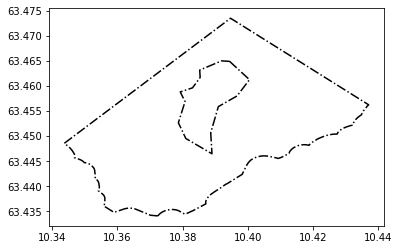

In [2]:
plt.plot(plg_obs[:, 1], plg_obs[:, 0], 'k-.')
plt.plot(plg_border[:, 1], plg_border[:, 0], 'k-.')


In [3]:
x_border, y_border = WGS.latlon2xy(plg_border[:, 0], plg_border[:, 1])
xmin, ymin = map(np.amin, [x_border, y_border])
xmax, ymax = map(np.amax, [x_border, y_border])
plg_border_xy = np.stack((x_border, y_border), axis=1)
plg_border_shapely = Polygon(plg_border_xy)

x_obs, y_obs = WGS.latlon2xy(plg_obs[:, 0], plg_obs[:, 1])
plg_obs_xy = np.stack((x_obs, y_obs), axis=1)
plg_obs_shapely = Polygon(plg_obs_xy)

def get_random_locations(n):
    locations = []
    for i in tqdm(range(n)):  
        xr = np.random.uniform(xmin, xmax)
        yr = np.random.uniform(ymin, ymax)
        point = Point(xr, yr)
        if plg_border_shapely.contains(point) and not plg_obs_shapely.contains(point):
            locations.append([xr, yr])
    locs = np.array(locations)
    print("Acceptance rate: ", len(locs) / n)
    print("Total {:d} random locations are generated!".format(len(locs)))
    print("Can be used for {:d} iterations in RRT* planning".format(int(len(locs)/2000)))
    return locs

TT = 800000 * np.ones(12).astype(int)
res = Parallel(n_jobs=5)(delayed(get_random_locations)(tt) for tt in TT)

rest = np.empty([0, 2])
for i in range(len(res)):
    rest = np.append(rest, res[0], axis=0)

 99%|█████████▉| 794002/800000 [01:53<00:00, 9080.44it/s]

Acceptance rate:  0.4590075
Total 367206 random locations are generated!
Can be used for 183 iterations in RRT* planning


  0%|          | 3932/800000 [00:00<01:21, 9796.20it/s]

Acceptance rate:  0.45931
Total 367448 random locations are generated!
Can be used for 183 iterations in RRT* planning
Acceptance rate:  0.45950125
Total 367601 random locations are generated!
Can be used for 183 iterations in RRT* planning


  1%|          | 6394/800000 [00:00<01:28, 9012.91it/s]]

Acceptance rate:  0.45917375
Total 367339 random locations are generated!
Can be used for 183 iterations in RRT* planning


  1%|▏         | 10516/800000 [00:01<01:24, 9290.84it/s]

Acceptance rate:  0.45904
Total 367232 random locations are generated!
Can be used for 183 iterations in RRT* planning


 98%|█████████▊| 786040/800000 [01:15<00:01, 9620.04it/s]

Acceptance rate:  0.4592425
Total 367394 random locations are generated!
Can be used for 183 iterations in RRT* planning


  0%|          | 0/800000 [00:00<?, ?it/s]1, 9572.94it/s]

Acceptance rate:  0.4594775
Total 367582 random locations are generated!
Can be used for 183 iterations in RRT* planning


100%|██████████| 800000/800000 [00:57<00:00, 13958.22it/s]


Acceptance rate:  0.45942875
Total 367543 random locations are generated!
Can be used for 183 iterations in RRT* planning
Acceptance rate:  0.4581425
Total 366514 random locations are generated!
Can be used for 183 iterations in RRT* planning
Acceptance rate:  0.4585475
Total 366838 random locations are generated!
Can be used for 183 iterations in RRT* planning
Acceptance rate:  0.45907875
Total 367263 random locations are generated!
Can be used for 183 iterations in RRT* planning
Acceptance rate:  0.45947875
Total 367583 random locations are generated!
Can be used for 183 iterations in RRT* planning


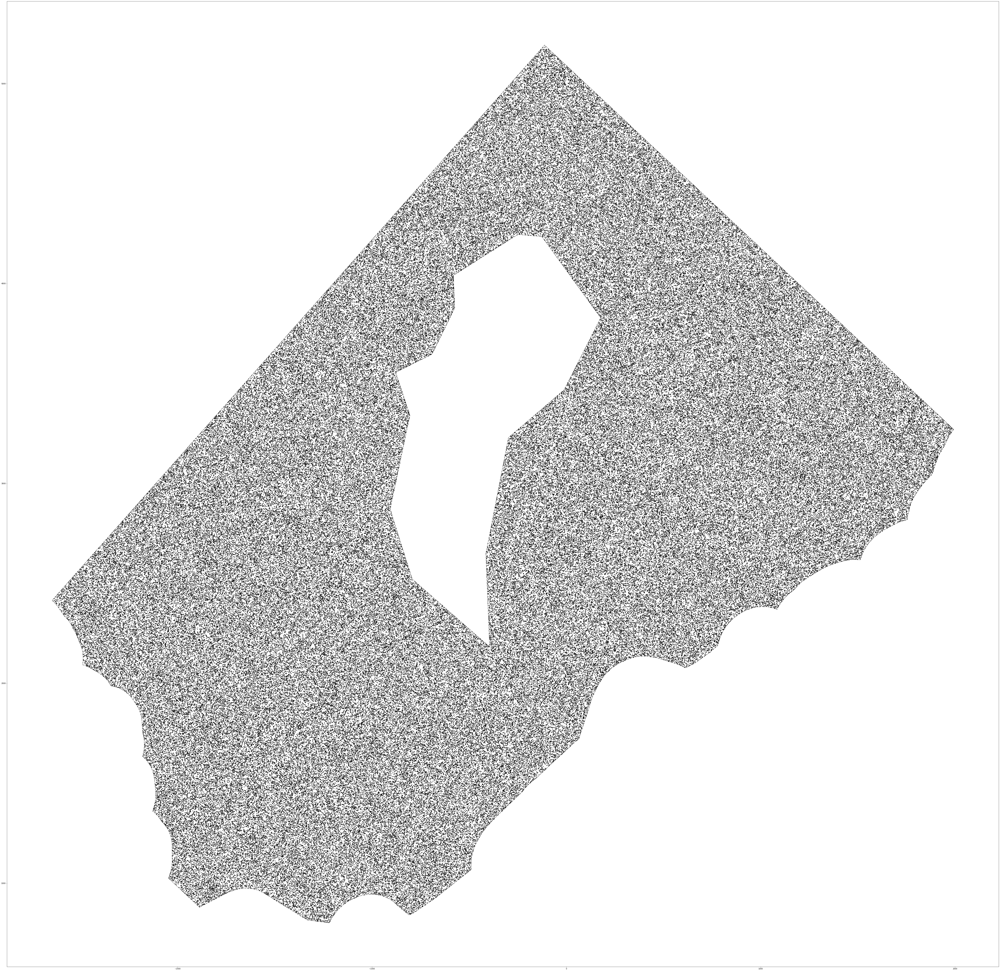

In [4]:
plt.figure(figsize=(100, 100))
plt.plot(plg_border_xy[:, 1], plg_border_xy[:, 0], 'k-.')
plt.plot(plg_obs_xy[:, 1], plg_obs_xy[:, 0], 'k-.')
plt.plot(rest[:, 1], rest[:, 0], 'k.', alpha=.1)

In [5]:
indices = np.random.uniform(0, 1., len(rest))  # get random indices used for rrt* planning

np.save("RRT_Random_Locations.npy", rest)
np.save("Goal_indices.npy", indices)
